# **Q1: Spatial Reasoning & Data Filtering [5 Marks]**

In [5]:
import pandas as pd
import numpy as np
import os
import geopandas as gpd

In [6]:
delhi_ncr = gpd.read_file("/content/data/delhi_ncr_region.geojson").to_crs(epsg=32644)
delhi_airshed = gpd.read_file("/content/data/delhi_airshed.geojson").to_crs(epsg=32644)

**Plot the Delhi-NCR shapefile using matplotlib and overlay a 60×60 km uniform grid (1 marks)**


In [7]:
from shapely.geometry import box

xmin, ymin, xmax, ymax = delhi_ncr.total_bounds
grid_size = 60000
cols = list(range(int(xmin), int(xmax), grid_size))
rows = list(range(int(ymin), int(ymax), grid_size))
polygons = []

for x in cols:
    for y in rows:
        polygons.append(box(x, y, x + grid_size, y + grid_size))

grid = gpd.GeoDataFrame({'geometry': polygons}, crs=delhi_ncr.crs)

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

**Overlay this grid on a satellite basemap using geemap or leafmap (1 mark)**

In [8]:
!pip install leafmap
import leafmap

grid_4326 = grid.to_crs(epsg=4326)
delhi_ncr_4326 = delhi_ncr.to_crs(epsg=4326)

m = leafmap.Map(center=[28.6, 77.2], zoom=8)
m.add_basemap("SATELLITE")

m.add_gdf(delhi_ncr_4326, layer_name="Delhi-NCR Boundary")
m.add_gdf(grid_4326, layer_name="60x60 Grid")

m.save("delhi_ncr_grid_leafmap.html")

m

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.1/568.1 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.7/220.7 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 101.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 837.4/837.4 kB 62.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.8/206.8 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 81.7 MB/s eta 0:00:00


Map(center=[28.6, 77.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

**Mark the four corners and the center of each grid cell (1 mark)**

In [9]:
from shapely.geometry import Point

corners = []
centers = []

for cell in grid.geometry:
    minx, miny, maxx, maxy = cell.bounds

    corners.extend([
        Point(minx, miny),
        Point(maxx, miny),
        Point(minx, maxy),
        Point(maxx, maxy)
    ])

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2
    centers.append(Point(center_x, center_y))

corners_gdf = gpd.GeoDataFrame(geometry=corners, crs=grid.crs).to_crs(epsg=4326)
centers_gdf = gpd.GeoDataFrame(geometry=centers, crs=grid.crs).to_crs(epsg=4326)

m.add_gdf(corners_gdf, "Grid Corners", style={"color": "blue"})
m.add_gdf(centers_gdf, "Grid Centers", style={"color": "red"})

m

Map(center=[28.6, 77.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

**Filter images based on whether their center coordinates fall within the grid (1 mark)**

In [10]:
image_folder = "/content/images"
image_files = [f for f in os.listdir(image_folder) if f.endswith(".png")]

records = []

for filename in image_files:
    name_part = os.path.splitext(filename)[0]

    try:
        lat_str, lon_str = name_part.split("_")
        lat = float(lat_str)
        lon = float(lon_str)
        records.append({'filename': filename, 'lat': lat, 'lon': lon})
    except Exception as e:
        print(f"Skipping {filename}: {e}")

coords_df = pd.DataFrame(records)
coords_df.to_csv("data/image_coords.csv", index=False)


In [11]:
coords_df = pd.read_csv("data/image_coords.csv")
coords_gdf = gpd.GeoDataFrame(
    coords_df, geometry=gpd.points_from_xy(coords_df.lon, coords_df.lat), crs="EPSG:4326"
)
coords_gdf = coords_gdf.to_crs(epsg=32644)

**Count and report the number of images before and after filtering (1 mark)**

In [12]:
filtered = coords_gdf[coords_gdf.geometry.within(delhi_ncr.unary_union)]
print("Total Images:", len(coords_df))
print("Filtered Images:", len(filtered))

Total Images: 1206
Filtered Images: 1206


#**Q2: Label Construction & Dataset Preparation [10 Marks]**

**For each image, extract a 128×128 patch from the land_cover.tif centered at the image's coordinate (2 marks)**

In [13]:
!pip install rasterio
import rasterio

land_cover = rasterio.open("/content/data/worldcover_bbox_delhi_ncr_2021.tif")
coords_gdf = coords_gdf.to_crs(land_cover.crs)

image_filenames = []
land_cover_patches = []

for idx, row in coords_gdf.iterrows():
    x, y = row.geometry.x, row.geometry.y

    try:
        row_idx, col_idx = land_cover.index(x, y)

        half_size = 64
        window = rasterio.windows.Window(
            col_off=col_idx - half_size,
            row_off=row_idx - half_size,
            width=128,
            height=128
        )

        patch = land_cover.read(1, window=window)

        image_filenames.append(row['filename'])
        land_cover_patches.append(patch)

    except Exception as e:
        print(f"Error processing image {row['filename']}: {e}")
        continue


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 107.6 MB/s eta 0:00:00


**Assign a label using the mode (most frequent) land cover class in the patch (2 marks)**

In [14]:
from scipy.stats import mode

labels = []

for patch in land_cover_patches:
    flat = patch.flatten()
    dominant_class = mode(flat, keepdims=True)[0][0]
    labels.append(dominant_class)


**Map ESA class codes to 11 standardized labels (1 mark)**

In [17]:
ESA_TO_LABEL = {
    10: 'Tree Cover', 20: 'Shrubland', 30: 'Grassland', 40: 'Cropland', 50: 'Built-up',
    60: 'Bare/Sparse Veg', 70: 'Snow/Ice', 80: 'Water', 90: 'Wetland', 95: 'Mangrove', 100: 'Moss/Lichen'
}

esa_codes = sorted(ESA_TO_LABEL.keys())
label_to_index = {code: i for i, code in enumerate(esa_codes)}
index_to_label = {i: ESA_TO_LABEL[code] for code, i in label_to_index.items()}

In [18]:
label_indices = [label_to_index.get(lbl, -1) for lbl in labels]

**Handle edge cases and discuss treatment of no-data pixels or mixed class dominance (2 marks)**

In [19]:
valid_images = []
valid_labels = []

for img, lbl in zip(image_filenames, label_indices):
    if lbl != -1:
        valid_images.append(img)
        valid_labels.append(lbl)

print("✅ Total valid image-label pairs:", len(valid_images))

✅ Total valid image-label pairs: 1206


**Perform a 60/40 train-test split randomly (1 mark)**

In [20]:
from sklearn.model_selection import train_test_split

dataset = pd.DataFrame({'image': valid_images, 'label_idx': valid_labels})

label_counts = dataset['label_idx'].value_counts()
valid_classes = label_counts[label_counts >= 2].index
dataset = dataset[dataset['label_idx'].isin(valid_classes)].reset_index(drop=True)

train_df, test_df = train_test_split(
    dataset,
    test_size=0.4,
    stratify=dataset['label_idx'],
    random_state=42
)


**Visualize class distribution and discuss balance (or imbalance) (2 marks)**

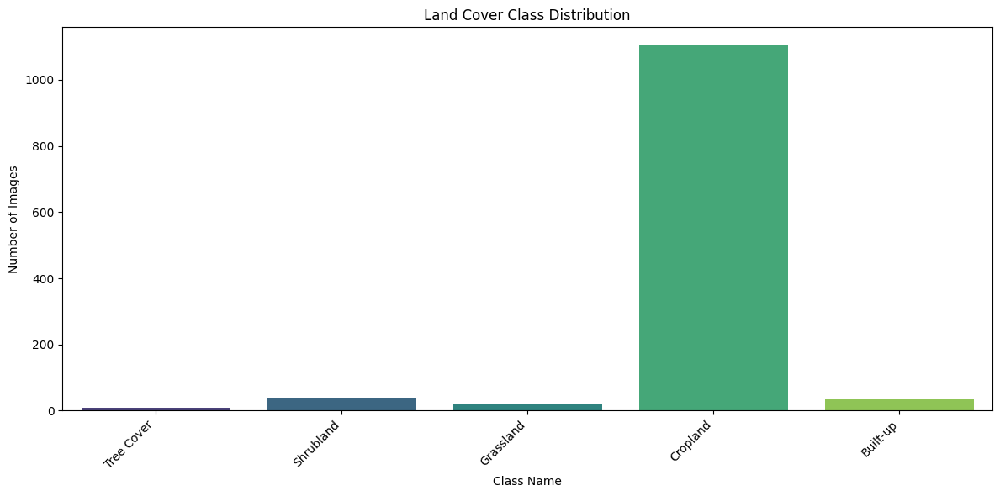

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

label_counts = Counter(valid_labels)

labels_sorted = sorted(label_counts.keys())
counts = [label_counts[lbl] for lbl in labels_sorted]
class_names = [index_to_label[lbl] for lbl in labels_sorted]

plt.figure(figsize=(12, 6))
sns.barplot(x=class_names, y=counts, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title("Land Cover Class Distribution")
plt.xlabel("Class Name")
plt.ylabel("Number of Images")
plt.tight_layout()
plt.show()


# **Q3: Model Training & Evaluation [10 Marks]**

**Train a CNN classifier (e.g., ResNet18) on the training set (3 marks)**

In [22]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image

In [23]:
class LandCoverDataset(Dataset):
    def __init__(self, df, image_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.df.loc[idx, "image"])
        image = Image.open(img_path).convert("RGB")
        label = self.df.loc[idx, "label_idx"]

        if self.transform:
            image = self.transform(image)

        return image, label

In [24]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])


In [25]:
batch_size = 32
train_dataset = LandCoverDataset(train_df, image_dir="images", transform=transform)
test_dataset = LandCoverDataset(test_df, image_dir="images", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)


In [26]:
num_classes = len(set(train_df['label_idx']))

model = models.resnet18(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, num_classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)


In [27]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [28]:
for epoch in range(5):
    model.train()
    total_loss = 0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {total_loss / len(train_loader):.4f}")


Epoch 1, Loss: 0.5342
Epoch 2, Loss: 0.3602
Epoch 3, Loss: 0.3454
Epoch 4, Loss: 0.2907
Epoch 5, Loss: 0.2751


**Evaluate using a custom F1 score implementation (2 marks)**

In [33]:
from sklearn.metrics import f1_score

model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        outputs = model(imgs)
        preds = outputs.argmax(dim=1).cpu().numpy()
        y_pred.extend(preds)
        y_true.extend(labels.numpy())

print("Custom F1:", f1_score(y_true, y_pred, average='weighted'))


Custom F1: 0.3038895232349067


**Evaluate using torchmetrics.F1Score and compare results (2 marks)**

In [34]:
from torchmetrics.classification import MulticlassF1Score

# Step 1: Collect predictions and labels
all_preds = []
all_labels = []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        preds = outputs.argmax(dim=1)
        all_preds.append(preds)
        all_labels.append(labels)

# Step 2: Concatenate all predictions and labels
all_preds = torch.cat(all_preds)
all_labels = torch.cat(all_labels)

# Step 3: Define the torchmetrics F1Score correctly
num_classes = len(torch.unique(all_labels))
f1_metric = MulticlassF1Score(num_classes=num_classes, average='weighted').to(device)

# Step 4: Compute the F1 score
f1_score_torchmetrics = f1_metric(all_preds, all_labels)
print("Torchmetrics F1:", f1_score_torchmetrics.item())

Torchmetrics F1: 0.30388951301574707


**Show and explain a confusion matrix (2 marks)**

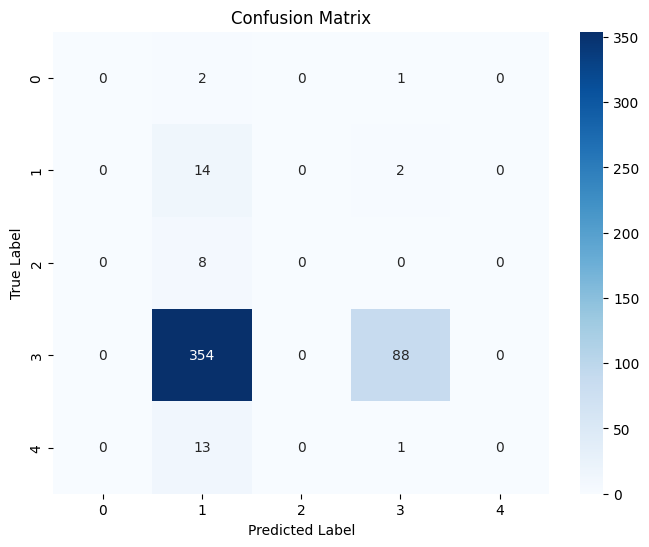

In [36]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


**Plot 5 correct and 5 incorrect predictions with images and labels (1 mark)**

In [37]:
correct = []
incorrect = []

model.eval()

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        outputs = model(imgs)
        _, preds = torch.max(outputs, 1)

        for i in range(len(labels)):
            img = imgs[i].cpu()
            pred_label = preds[i].item()
            true_label = labels[i].item()

            img_np = img.permute(1, 2, 0).numpy()

            if pred_label == true_label and len(correct) < 5:
                correct.append((img_np, true_label, pred_label))
            elif pred_label != true_label and len(incorrect) < 5:
                incorrect.append((img_np, true_label, pred_label))

        if len(correct) >= 5 and len(incorrect) >= 5:
            break


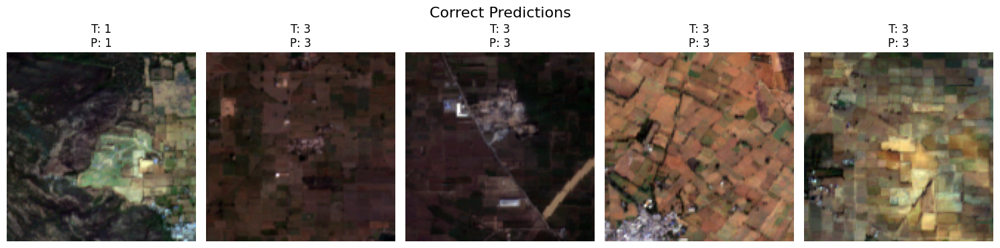

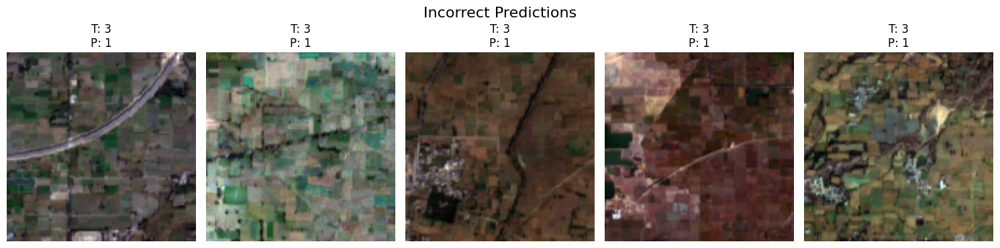

In [38]:
def plot_predictions(predictions, title):
    plt.figure(figsize=(15, 4))
    for i, (img, true_label, pred_label) in enumerate(predictions):
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"T: {true_label}\nP: {pred_label}")
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

plot_predictions(correct, "Correct Predictions")
plot_predictions(incorrect, "Incorrect Predictions")
